## 4. AutoEncoder : Comparitive Analysis

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torchvision import transforms
import random
from sklearn.decomposition import PCA
import seaborn as sns

### 4.2 CNN AutoEncoder

#### 4.2.1 Dataset Analysis and Preprocessing

In [2]:
train_df = pd.read_csv('fashion-mnist_train.csv')
test_df = pd.read_csv('fashion-mnist_test.csv')

fashion_df = pd.concat([train_df, test_df], ignore_index=True)

# Display the combined DataFrame
print(f"Number of datapoints in full dataset : {len(fashion_df)}")

train_df, temp_df = train_test_split(fashion_df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=2/3, random_state=42)

print(f"Training set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

unique_train=train_df.iloc[:,0].unique()
unique_test=test_df.iloc[:,0].unique()
unique_val=val_df.iloc[:,0].unique()

print(unique_train)
print(unique_test)
print(unique_val)


Number of datapoints in full dataset : 70000
Training set size: 49000
Validation set size: 7000
Test set size: 14000
[4 7 9 2 0 1 5 8 6 3]
[2 8 5 9 1 3 6 0 7 4]
[8 6 0 2 9 7 3 5 4 1]


/tmp/ipykernel_34342/1189178610.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = img_data[0]


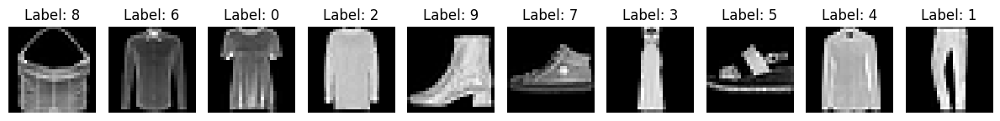

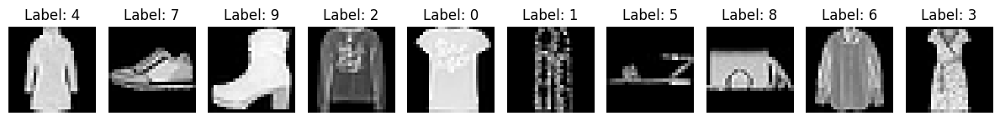

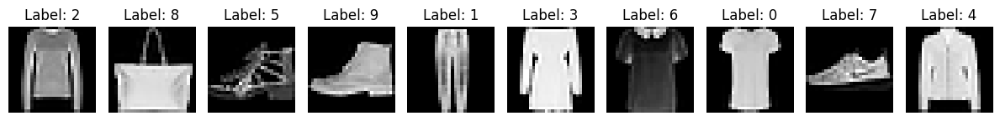

In [24]:

def plot_fashion_unique(data, num_labels=10):
    unique_lab=data.iloc[:,0].unique()
    unique_images=[data[data.iloc[:,0]==label].iloc[0] for label in unique_lab]
    plt.figure(figsize=(12, 4))

    for i,img_data in enumerate(unique_images):
        image_flattened = img_data[1:]
        image=image_flattened.values.reshape(28,28)
        label = img_data[0]  
        plt.subplot(1, num_labels, i + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Label: {label}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_fashion_unique(val_df,10)
plot_fashion_unique(train_df,10)
plot_fashion_unique(test_df,10)

**Clothing represented by each class**

- 0 - Top
- 1 - Pants
- 2 - Sweater/Cardigan
- 3 - Sundress
- 4 - Jacket
- 5 - Sandals
- 6 - Shirt
- 7 - Sneakers
- 8 - Bag
- 9 - Boots

#### 4.2.2 Implement the CnnAutoencoder Class

In [22]:
class Encoder(nn.Module):
    def __init__(self, latent_dim, filters=[16, 32], kernel_size=7):
        super(Encoder, self).__init__()

        padding = kernel_size // 2
        
        self.conv1_encoder = nn.Conv2d(in_channels=1, out_channels=filters[0], kernel_size=kernel_size, stride=2, padding=padding)
        self.conv2_encoder = nn.Conv2d(in_channels=filters[0], out_channels=filters[1], kernel_size=kernel_size, stride=2, padding=padding)
        self.feature_size = self._get_convimg_size(28, kernel_size, padding)
        self.linear_encoder = nn.Linear(in_features=filters[1] * self.feature_size * self.feature_size, out_features=latent_dim
        )
        
    def _get_convimg_size(self, input_size, kernel_size, padding):
        img_size = input_size
        for _ in range(2): 
            img_size = (img_size + 2 * padding - kernel_size) // 2 + 1
        return img_size
    
    def forward(self, x):
        x = F.relu(self.conv1_encoder(x))
        x = F.relu(self.conv2_encoder(x))
        x = x.view(x.size(0), -1)
        x = self.linear_encoder(x)
        return x,self.feature_size

class Decoder(nn.Module):
    def __init__(self, latent_dim, feature_size, filters=[16, 32], kernel_size=7):
        super(Decoder, self).__init__()

        padding = (kernel_size-1)//2

        self.feature_size = feature_size
        
        self.filters = filters
        self.linear_decoder = nn.Linear(
            in_features=latent_dim,
            out_features=filters[1] * self.feature_size * self.feature_size
        )
        
        self.conv2_decoder = nn.ConvTranspose2d(
            in_channels=filters[1],
            out_channels=filters[0],
            kernel_size=kernel_size,
            stride=2,
            padding=padding,
            output_padding=1
        )
        
        self.conv1_decoder = nn.ConvTranspose2d(
            in_channels=filters[0],
            out_channels=1,
            kernel_size=kernel_size,
            stride=2,
            padding=padding,
            output_padding=1
        )
    
    def forward(self, x):
        x = self.linear_decoder(x)
        x = x.view(x.size(0), self.filters[1], self.feature_size, self.feature_size)
        x = F.relu(self.conv2_decoder(x))
        x = torch.sigmoid(self.conv1_decoder(x))
        return x


class CNNAutoEncoder(nn.Module):
    def __init__(self,latent_dim,filters=[16,32],kernel_size=7):
        super(CNNAutoEncoder,self).__init__()

        self.encoder= Encoder(latent_dim,filters,kernel_size)
        self.decoder=Decoder(latent_dim, self.encoder.feature_size, filters,kernel_size)
    
    def forward(self,x):
        latent_vec, feature_size=self.encoder(x)
        reconstructed_vec=self.decoder(latent_vec)
        return reconstructed_vec


In [7]:
train_images = torch.tensor(train_df.iloc[:, 1:].values, dtype=torch.float32).view(-1, 1, 28, 28) / 255.0
train_dataset = TensorDataset(train_images)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)


In [107]:
latent_dim = 64
model = CNNAutoEncoder(latent_dim=latent_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for batch in train_loader:
        inputs = batch[0]
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    avg_train_loss = train_loss / len(train_loader)
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_train_loss:.4f}')

Epoch [1/10], Loss: 0.0232
Epoch [2/10], Loss: 0.0109
Epoch [3/10], Loss: 0.0088
Epoch [4/10], Loss: 0.0077
Epoch [5/10], Loss: 0.0071
Epoch [6/10], Loss: 0.0066
Epoch [7/10], Loss: 0.0064
Epoch [8/10], Loss: 0.0061
Epoch [9/10], Loss: 0.0060
Epoch [10/10], Loss: 0.0059


#### 4.2.3 Plots and Visualizations

In [41]:
test_images = torch.tensor(test_df.iloc[:, 1:].values, dtype=torch.float32).view(-1, 1, 28, 28) / 255.0
test_dataset = TensorDataset(test_images)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=True)

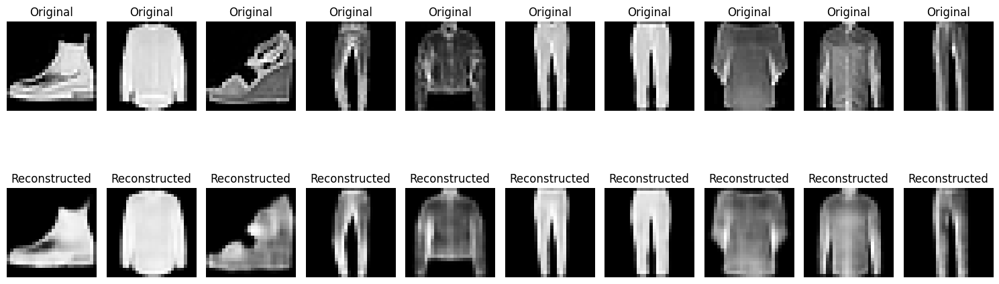

In [48]:
model.eval()
num_images=10
for batch in test_loader:
    input_imgs=batch[0]
    input_imgs=input_imgs[:num_images]
    input_imgs = input_imgs.to(next(model.parameters()).device)
    
    with torch.inference_mode():
        reconstructed_imgs=model(input_imgs)
        
    plt.figure(figsize=(15, 6))
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(input_imgs[i].cpu().squeeze(), cmap='gray')
        plt.title('Original')
        plt.axis('off')

        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(reconstructed_imgs[i].cpu().squeeze(), cmap='gray')
        plt.title('Reconstructed')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    break

- We can see that the reconstructed images are almost perfect compared to the original image. Visibly, it is noticeable that some of the details from the original images have been smoothened out in the reconstructed image but the major overall structure is preserved ensuring that the cnn autoencoder is trained well.

In [70]:
model.eval()
encoded_rep=[]
labels=[]

test_images = torch.tensor(test_df.iloc[:, 1:].values, dtype=torch.float32).view(-1, 1, 28, 28) / 255.0
test_labels = torch.tensor(test_df.iloc[:, 0].values, dtype=torch.long)
test_dataset = TensorDataset(test_images, test_labels)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=True)

with torch.inference_mode():
    for batch in test_loader:
        input_imgs,batch_labels=batch
        input_imgs = input_imgs.to(next(model.parameters()).device)  # Move to the same device
        encoded,_ = model.encoder(input_imgs)  # Get the encoded representation
        encoded_rep.append(encoded.cpu().numpy())  # Convert to numpy and store
        labels.append(batch_labels.cpu().numpy())

encoded_rep = np.concatenate(encoded_rep)
labels = np.concatenate(labels)
print(np.unique(labels))

[0 1 2 3 4 5 6 7 8 9]


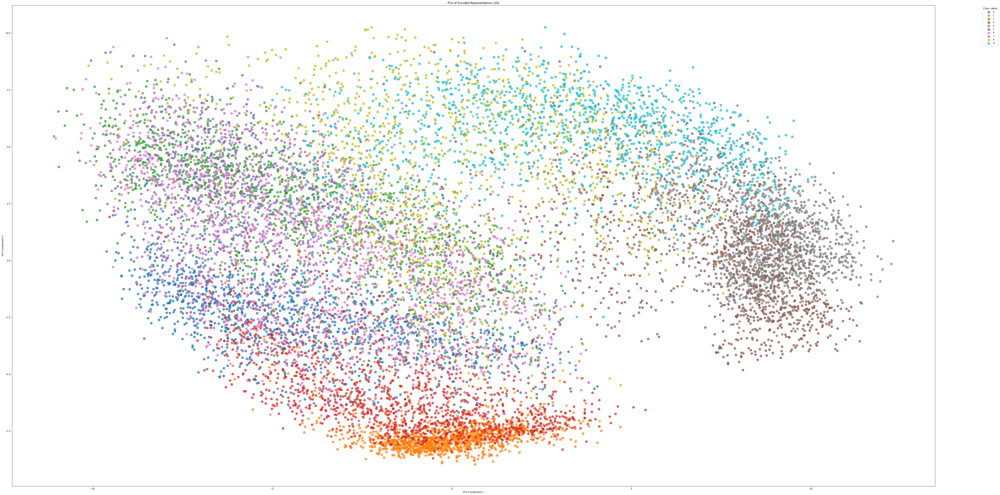

In [79]:
pca_2d = PCA(n_components=2)
encoded_2d = pca_2d.fit_transform(encoded_rep)

plt.figure(figsize=(60, 30))
cmap = plt.get_cmap("tab10")

unique_labels = np.unique(labels)
for i, label in enumerate(unique_labels):
    plt.scatter(encoded_2d[labels == label, 0], encoded_2d[labels == label, 1], 
                label=label, color=cmap(i), alpha=0.7, s=100)  

plt.title('PCA of Encoded Representations (2D)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')

plt.legend(title='Class Labels', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

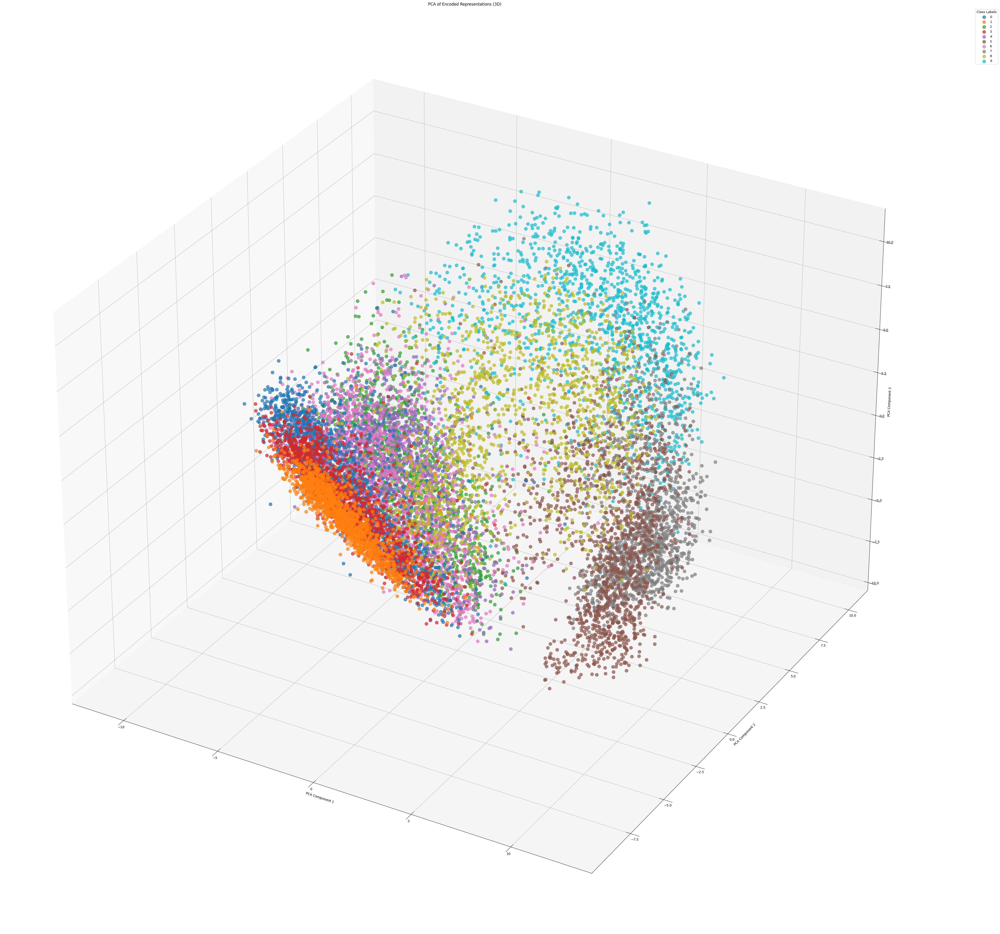

In [81]:

pca_3d = PCA(n_components=3)
encoded_3d = pca_3d.fit_transform(encoded_rep)

fig = plt.figure(figsize=(100, 40))
ax = fig.add_subplot(111, projection='3d')

cmap = plt.get_cmap("tab10")

unique_labels = np.unique(labels)

for i, label in enumerate(unique_labels):
    ax.scatter(encoded_3d[labels == label, 0], encoded_3d[labels == label, 1], 
               encoded_3d[labels == label, 2], 
               label=label, color=cmap(i), alpha=0.7, s=100)  

ax.set_title('PCA of Encoded Representations (3D)')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')

ax.legend(title='Class Labels', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


**Observations**

**2-D Visualization:**

- Classes 8,9 and 2,4,6 are majorly overlapped. There is no clear clustering seen. 
- Classes 0,1,3,5 are distributes along a very small space with 1 concentrated at a major place. However clear clustering is not observable and we can't partition the datapoints.

**3-D Visualization:**
- We see that on increase dimensions we can very well draw partitions for the clustering. 
- There is very clear demarcation for clusters 1, 8 and 9. 1 is Dense and well-defined, positioned on one end. 9 Overlaps very partially with others. 8 is well positioned in the centre occupying a major area showing even spread in all directions. 


#### 4.2.4 Hyperparameter Tuning

In [8]:
learning_rates=[0.01,0.001]
kernel_sizes=[7,5,3]
num_filters=[[16,32],[8,16],[32,64]]
optimizers=["sgd","adam"]

train_images = torch.tensor(train_df.iloc[:, 1:].values, dtype=torch.float32).view(-1, 1, 28, 28) / 255.0
train_labels = torch.tensor(train_df.iloc[:, 0].values, dtype=torch.long)
train_dataset = TensorDataset(train_images, train_labels)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

val_images = torch.tensor(val_df.iloc[:, 1:].values, dtype=torch.float32).view(-1, 1, 28, 28) / 255.0
val_labels = torch.tensor(val_df.iloc[:, 0].values, dtype=torch.long)
val_dataset = TensorDataset(val_images, val_labels)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=True)

epochs=10

In [5]:
def hyptune_autoencoder(model, train_loader, val_loader, criterion, optimizer, epochs=10):
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for images, _ in train_loader:
            # print(images.shape)
            optimizer.zero_grad()
            outputs = model(images) 
            # print(outputs.shape)         
            loss = criterion(outputs, images)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_losses.append(train_loss / len(train_loader))

        # Validation
        model.eval()
        val_loss = 0
        with torch.inference_mode():
            for images, _ in val_loader:
                outputs = model(images)
                loss = criterion(outputs, images)
                val_loss += loss.item()

        val_losses.append(val_loss / len(val_loader))

        print(f'Epoch [{epoch + 1}/{epochs}], Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')

    return train_losses, val_losses


In [ ]:
all_results = {}
for lr in learning_rates:
    for kernel_size in kernel_sizes:
        for filters in num_filters:
            for opt_name in optimizers:

                model = CNNAutoEncoder(latent_dim=64, filters=filters, kernel_size=kernel_size)
                criterion = nn.MSELoss()
                if opt_name == 'sgd':
                    optimizer = optim.SGD(model.parameters(), lr=lr)
                elif opt_name == 'adam':
                    optimizer = optim.Adam(model.parameters(), lr=lr)
                
                print(f'Training with LR: {lr}, Kernel Size: {kernel_size}, Filters: {filters}, Optimizer: {opt_name}')
                train_losses, val_losses = hyptune_autoencoder(model, train_loader, val_loader, criterion, optimizer, epochs)

                combination = f'LR_{lr}_KS_{kernel_size}_F_{filters}_OPT_{opt_name}'
                all_results[combination] = {
                    'train_losses': train_losses,
                    'val_losses': val_losses
                }


**Training with LR: 0.01, Kernel Size: 7, Filters: [16, 32], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1492, Val Loss: 0.1323
- Epoch [2/10], Train Loss: 0.1287, Val Loss: 0.1269
- Epoch [3/10], Train Loss: 0.1260, Val Loss: 0.1256
- Epoch [4/10], Train Loss: 0.1248, Val Loss: 0.1243
- Epoch [5/10], Train Loss: 0.1234, Val Loss: 0.1224
- Epoch [6/10], Train Loss: 0.1202, Val Loss: 0.1177
- Epoch [7/10], Train Loss: 0.1106, Val Loss: 0.0991
- Epoch [8/10], Train Loss: 0.0871, Val Loss: 0.0797
- Epoch [9/10], Train Loss: 0.0756, Val Loss: 0.0722
- Epoch [10/10], Train Loss: 0.0689, Val Loss: 0.0660

**Training with LR: 0.01, Kernel Size: 7, Filters: [16, 32], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0206, Val Loss: 0.0122
- Epoch [2/10], Train Loss: 0.0110, Val Loss: 0.0104
- Epoch [3/10], Train Loss: 0.0094, Val Loss: 0.0103
- Epoch [4/10], Train Loss: 0.0087, Val Loss: 0.0087
- Epoch [5/10], Train Loss: 0.0082, Val Loss: 0.0094
- Epoch [6/10], Train Loss: 0.0079, Val Loss: 0.0078
- Epoch [7/10], Train Loss: 0.0077, Val Loss: 0.0076
- Epoch [8/10], Train Loss: 0.0076, Val Loss: 0.0074
- Epoch [9/10], Train Loss: 0.0074, Val Loss: 0.0073
- Epoch [10/10], Train Loss: 0.0074, Val Loss: 0.0084

**Training with LR: 0.01, Kernel Size: 7, Filters: [8, 16], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1399, Val Loss: 0.1301
- Epoch [2/10], Train Loss: 0.1273, Val Loss: 0.1259
- Epoch [3/10], Train Loss: 0.1252, Val Loss: 0.1249
- Epoch [4/10], Train Loss: 0.1247, Val Loss: 0.1247
- Epoch [5/10], Train Loss: 0.1245, Val Loss: 0.1246
- Epoch [6/10], Train Loss: 0.1244, Val Loss: 0.1244
- Epoch [7/10], Train Loss: 0.1243, Val Loss: 0.1244
- Epoch [8/10], Train Loss: 0.1242, Val Loss: 0.1243
- Epoch [9/10], Train Loss: 0.1241, Val Loss: 0.1242
- Epoch [10/10], Train Loss: 0.1239, Val Loss: 0.1240

**Training with LR: 0.01, Kernel Size: 7, Filters: [8, 16], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0209, Val Loss: 0.0127
- Epoch [2/10], Train Loss: 0.0114, Val Loss: 0.0106
- Epoch [3/10], Train Loss: 0.0097, Val Loss: 0.0093
- Epoch [4/10], Train Loss: 0.0089, Val Loss: 0.0085
- Epoch [5/10], Train Loss: 0.0084, Val Loss: 0.0086
- Epoch [6/10], Train Loss: 0.0081, Val Loss: 0.0079
- Epoch [7/10], Train Loss: 0.0079, Val Loss: 0.0076
- Epoch [8/10], Train Loss: 0.0079, Val Loss: 0.0084
- Epoch [9/10], Train Loss: 0.0078, Val Loss: 0.0076
- Epoch [10/10], Train Loss: 0.0077, Val Loss: 0.0075

**Training with LR: 0.01, Kernel Size: 7, Filters: [32, 64], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1481, Val Loss: 0.1315
- Epoch [2/10], Train Loss: 0.1280, Val Loss: 0.1260
- Epoch [3/10], Train Loss: 0.1249, Val Loss: 0.1241
- Epoch [4/10], Train Loss: 0.1227, Val Loss: 0.1214
- Epoch [5/10], Train Loss: 0.1176, Val Loss: 0.1115
- Epoch [6/10], Train Loss: 0.0957, Val Loss: 0.0830
- Epoch [7/10], Train Loss: 0.0778, Val Loss: 0.0737
- Epoch [8/10], Train Loss: 0.0704, Val Loss: 0.0674
- Epoch [9/10], Train Loss: 0.0640, Val Loss: 0.0606
- Epoch [10/10], Train Loss: 0.0571, Val Loss: 0.0541

**Training with LR: 0.01, Kernel Size: 7, Filters: [32, 64], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0201, Val Loss: 0.0121
- Epoch [2/10], Train Loss: 0.0110, Val Loss: 0.0097
- Epoch [3/10], Train Loss: 0.0094, Val Loss: 0.0087
- Epoch [4/10], Train Loss: 0.0087, Val Loss: 0.0082
- Epoch [5/10], Train Loss: 0.0082, Val Loss: 0.0081
- Epoch [6/10], Train Loss: 0.0080, Val Loss: 0.0077
- Epoch [7/10], Train Loss: 0.0079, Val Loss: 0.0081
- Epoch [8/10], Train Loss: 0.0077, Val Loss: 0.0075
- Epoch [9/10], Train Loss: 0.0077, Val Loss: 0.0075
- Epoch [10/10], Train Loss: 0.0076, Val Loss: 0.0074

**Training with LR: 0.01, Kernel Size: 5, Filters: [16, 32], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1514, Val Loss: 0.1334
- Epoch [2/10], Train Loss: 0.1289, Val Loss: 0.1265
- Epoch [3/10], Train Loss: 0.1256, Val Loss: 0.1253
- Epoch [4/10], Train Loss: 0.1247, Val Loss: 0.1246
- Epoch [5/10], Train Loss: 0.1242, Val Loss: 0.1242
- Epoch [6/10], Train Loss: 0.1237, Val Loss: 0.1235
- Epoch [7/10], Train Loss: 0.1228, Val Loss: 0.1224
- Epoch [8/10], Train Loss: 0.1211, Val Loss: 0.1196
- Epoch [9/10], Train Loss: 0.1153, Val Loss: 0.1088
- Epoch [10/10], Train Loss: 0.0984, Val Loss: 0.0894

**Training with LR: 0.01, Kernel Size: 5, Filters: [16, 32], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0178, Val Loss: 0.0109
- Epoch [2/10], Train Loss: 0.0096, Val Loss: 0.0089
- Epoch [3/10], Train Loss: 0.0081, Val Loss: 0.0079
- Epoch [4/10], Train Loss: 0.0074, Val Loss: 0.0078
- Epoch [5/10], Train Loss: 0.0072, Val Loss: 0.0067
- Epoch [6/10], Train Loss: 0.0069, Val Loss: 0.0074
- Epoch [7/10], Train Loss: 0.0068, Val Loss: 0.0074
- Epoch [8/10], Train Loss: 0.0067, Val Loss: 0.0067
- Epoch [9/10], Train Loss: 0.0067, Val Loss: 0.0066
- Epoch [10/10], Train Loss: 0.0066, Val Loss: 0.0064

**Training with LR: 0.01, Kernel Size: 5, Filters: [8, 16], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1419, Val Loss: 0.1305
- Epoch [2/10], Train Loss: 0.1276, Val Loss: 0.1260
- Epoch [3/10], Train Loss: 0.1255, Val Loss: 0.1253
- Epoch [4/10], Train Loss: 0.1249, Val Loss: 0.1250
- Epoch [5/10], Train Loss: 0.1247, Val Loss: 0.1247
- Epoch [6/10], Train Loss: 0.1245, Val Loss: 0.1245
- Epoch [7/10], Train Loss: 0.1243, Val Loss: 0.1243
- Epoch [8/10], Train Loss: 0.1241, Val Loss: 0.1241
- Epoch [9/10], Train Loss: 0.1238, Val Loss: 0.1237
- Epoch [10/10], Train Loss: 0.1234, Val Loss: 0.1234

**Training with LR: 0.01, Kernel Size: 5, Filters: [8, 16], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0179, Val Loss: 0.0105
- Epoch [2/10], Train Loss: 0.0095, Val Loss: 0.0088
- Epoch [3/10], Train Loss: 0.0083, Val Loss: 0.0077
- Epoch [4/10], Train Loss: 0.0077, Val Loss: 0.0075
- Epoch [5/10], Train Loss: 0.0074, Val Loss: 0.0073
- Epoch [6/10], Train Loss: 0.0072, Val Loss: 0.0070
- Epoch [7/10], Train Loss: 0.0071, Val Loss: 0.0073
- Epoch [8/10], Train Loss: 0.0070, Val Loss: 0.0071
- Epoch [9/10], Train Loss: 0.0070, Val Loss: 0.0076
- Epoch [10/10], Train Loss: 0.0068, Val Loss: 0.0068

**Training with LR: 0.01, Kernel Size: 5, Filters: [32, 64], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1361, Val Loss: 0.1282
- Epoch [2/10], Train Loss: 0.1262, Val Loss: 0.1251
- Epoch [3/10], Train Loss: 0.1243, Val Loss: 0.1239
- Epoch [4/10], Train Loss: 0.1230, Val Loss: 0.1222
- Epoch [5/10], Train Loss: 0.1203, Val Loss: 0.1180
- Epoch [6/10], Train Loss: 0.1119, Val Loss: 0.1034
- Epoch [7/10], Train Loss: 0.0932, Val Loss: 0.0847
- Epoch [8/10], Train Loss: 0.0797, Val Loss: 0.0757
- Epoch [9/10], Train Loss: 0.0725, Val Loss: 0.0696
- Epoch [10/10], Train Loss: 0.0666, Val Loss: 0.0638

**Training with LR: 0.01, Kernel Size: 5, Filters: [32, 64], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0184, Val Loss: 0.0104
- Epoch [2/10], Train Loss: 0.0097, Val Loss: 0.0084
- Epoch [3/10], Train Loss: 0.0081, Val Loss: 0.0076
- Epoch [4/10], Train Loss: 0.0074, Val Loss: 0.0072
- Epoch [5/10], Train Loss: 0.0070, Val Loss: 0.0069
- Epoch [6/10], Train Loss: 0.0070, Val Loss: 0.0069
- Epoch [7/10], Train Loss: 0.0068, Val Loss: 0.0069
- Epoch [8/10], Train Loss: 0.0067, Val Loss: 0.0065
- Epoch [9/10], Train Loss: 0.0066, Val Loss: 0.0068
- Epoch [10/10], Train Loss: 0.0067, Val Loss: 0.0069

**Training with LR: 0.01, Kernel Size: 3, Filters: [16, 32], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1433, Val Loss: 0.1300
- Epoch [2/10], Train Loss: 0.1270, Val Loss: 0.1256
- Epoch [3/10], Train Loss: 0.1249, Val Loss: 0.1248
- Epoch [4/10], Train Loss: 0.1245, Val Loss: 0.1245
- Epoch [5/10], Train Loss: 0.1243, Val Loss: 0.1244
- Epoch [6/10], Train Loss: 0.1242, Val Loss: 0.1244
- Epoch [7/10], Train Loss: 0.1241, Val Loss: 0.1242
- Epoch [8/10], Train Loss: 0.1239, Val Loss: 0.1240
- Epoch [9/10], Train Loss: 0.1238, Val Loss: 0.1238
- Epoch [10/10], Train Loss: 0.1235, Val Loss: 0.1236

**Training with LR: 0.01, Kernel Size: 3, Filters: [16, 32], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0187, Val Loss: 0.0109
- Epoch [2/10], Train Loss: 0.0093, Val Loss: 0.0080
- Epoch [3/10], Train Loss: 0.0078, Val Loss: 0.0074
- Epoch [4/10], Train Loss: 0.0073, Val Loss: 0.0073
- Epoch [5/10], Train Loss: 0.0070, Val Loss: 0.0068
- Epoch [6/10], Train Loss: 0.0068, Val Loss: 0.0068
- Epoch [7/10], Train Loss: 0.0067, Val Loss: 0.0067
- Epoch [8/10], Train Loss: 0.0066, Val Loss: 0.0070
- Epoch [9/10], Train Loss: 0.0066, Val Loss: 0.0066
- Epoch [10/10], Train Loss: 0.0065, Val Loss: 0.0065

**Training with LR: 0.01, Kernel Size: 3, Filters: [8, 16], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1423, Val Loss: 0.1306
- Epoch [2/10], Train Loss: 0.1276, Val Loss: 0.1259
- Epoch [3/10], Train Loss: 0.1253, Val Loss: 0.1251
- Epoch [4/10], Train Loss: 0.1247, Val Loss: 0.1248
- Epoch [5/10], Train Loss: 0.1246, Val Loss: 0.1246
- Epoch [6/10], Train Loss: 0.1245, Val Loss: 0.1246
- Epoch [7/10], Train Loss: 0.1244, Val Loss: 0.1245
- Epoch [8/10], Train Loss: 0.1243, Val Loss: 0.1244
- Epoch [9/10], Train Loss: 0.1243, Val Loss: 0.1244
- Epoch [10/10], Train Loss: 0.1242, Val Loss: 0.1244

**Training with LR: 0.01, Kernel Size: 3, Filters: [8, 16], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0167, Val Loss: 0.0097
- Epoch [2/10], Train Loss: 0.0085, Val Loss: 0.0077
- Epoch [3/10], Train Loss: 0.0075, Val Loss: 0.0072
- Epoch [4/10], Train Loss: 0.0072, Val Loss: 0.0070
- Epoch [5/10], Train Loss: 0.0070, Val Loss: 0.0072
- Epoch [6/10], Train Loss: 0.0069, Val Loss: 0.0067
- Epoch [7/10], Train Loss: 0.0068, Val Loss: 0.0067
- Epoch [8/10], Train Loss: 0.0067, Val Loss: 0.0066
- Epoch [9/10], Train Loss: 0.0066, Val Loss: 0.0066
- Epoch [10/10], Train Loss: 0.0066, Val Loss: 0.0067

**Training with LR: 0.01, Kernel Size: 3, Filters: [32, 64], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1495, Val Loss: 0.1319
- Epoch [2/10], Train Loss: 0.1279, Val Loss: 0.1258
- Epoch [3/10], Train Loss: 0.1250, Val Loss: 0.1246
- Epoch [4/10], Train Loss: 0.1242, Val Loss: 0.1241
- Epoch [5/10], Train Loss: 0.1235, Val Loss: 0.1233
- Epoch [6/10], Train Loss: 0.1226, Val Loss: 0.1221
- Epoch [7/10], Train Loss: 0.1211, Val Loss: 0.1202
- Epoch [8/10], Train Loss: 0.1183, Val Loss: 0.1161
- Epoch [9/10], Train Loss: 0.1123, Val Loss: 0.1076
- Epoch [10/10], Train Loss: 0.1012, Val Loss: 0.0951

**Training with LR: 0.01, Kernel Size: 3, Filters: [32, 64], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0165, Val Loss: 0.0095
- Epoch [2/10], Train Loss: 0.0086, Val Loss: 0.0077
- Epoch [3/10], Train Loss: 0.0074, Val Loss: 0.0069
- Epoch [4/10], Train Loss: 0.0068, Val Loss: 0.0067
- Epoch [5/10], Train Loss: 0.0066, Val Loss: 0.0064
- Epoch [6/10], Train Loss: 0.0065, Val Loss: 0.0063
- Epoch [7/10], Train Loss: 0.0063, Val Loss: 0.0063
- Epoch [8/10], Train Loss: 0.0063, Val Loss: 0.0062
- Epoch [9/10], Train Loss: 0.0062, Val Loss: 0.0062
- Epoch [10/10], Train Loss: 0.0061, Val Loss: 0.0062

**Training with LR: 0.001, Kernel Size: 7, Filters: [16, 32], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1771, Val Loss: 0.1714
- Epoch [2/10], Train Loss: 0.1673, Val Loss: 0.1628
- Epoch [3/10], Train Loss: 0.1595, Val Loss: 0.1558
- Epoch [4/10], Train Loss: 0.1532, Val Loss: 0.1502
- Epoch [5/10], Train Loss: 0.1481, Val Loss: 0.1456
- Epoch [6/10], Train Loss: 0.1440, Val Loss: 0.1420
- Epoch [7/10], Train Loss: 0.1406, Val Loss: 0.1391
- Epoch [8/10], Train Loss: 0.1378, Val Loss: 0.1365
- Epoch [9/10], Train Loss: 0.1356, Val Loss: 0.1346
- Epoch [10/10], Train Loss: 0.1338, Val Loss: 0.1329

**Training with LR: 0.001, Kernel Size: 7, Filters: [16, 32], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0243, Val Loss: 0.0131
- Epoch [2/10], Train Loss: 0.0110, Val Loss: 0.0096
- Epoch [3/10], Train Loss: 0.0090, Val Loss: 0.0083
- Epoch [4/10], Train Loss: 0.0079, Val Loss: 0.0075
- Epoch [5/10], Train Loss: 0.0072, Val Loss: 0.0069
- Epoch [6/10], Train Loss: 0.0067, Val Loss: 0.0065
- Epoch [7/10], Train Loss: 0.0064, Val Loss: 0.0064
- Epoch [8/10], Train Loss: 0.0061, Val Loss: 0.0060
- Epoch [9/10], Train Loss: 0.0059, Val Loss: 0.0059
- Epoch [10/10], Train Loss: 0.0058, Val Loss: 0.0058

**Training with LR: 0.001, Kernel Size: 7, Filters: [8, 16], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1597, Val Loss: 0.1561
- Epoch [2/10], Train Loss: 0.1535, Val Loss: 0.1505
- Epoch [3/10], Train Loss: 0.1484, Val Loss: 0.1460
- Epoch [4/10], Train Loss: 0.1443, Val Loss: 0.1423
- Epoch [5/10], Train Loss: 0.1409, Val Loss: 0.1393
- Epoch [6/10], Train Loss: 0.1382, Val Loss: 0.1368
- Epoch [7/10], Train Loss: 0.1359, Val Loss: 0.1349
- Epoch [8/10], Train Loss: 0.1341, Val Loss: 0.1332
- Epoch [9/10], Train Loss: 0.1326, Val Loss: 0.1319
- Epoch [10/10], Train Loss: 0.1313, Val Loss: 0.1307

**Training with LR: 0.001, Kernel Size: 7, Filters: [8, 16], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0285, Val Loss: 0.0158
- Epoch [2/10], Train Loss: 0.0138, Val Loss: 0.0120
- Epoch [3/10], Train Loss: 0.0112, Val Loss: 0.0103
- Epoch [4/10], Train Loss: 0.0099, Val Loss: 0.0093
- Epoch [5/10], Train Loss: 0.0090, Val Loss: 0.0088
- Epoch [6/10], Train Loss: 0.0084, Val Loss: 0.0082
- Epoch [7/10], Train Loss: 0.0080, Val Loss: 0.0077
- Epoch [8/10], Train Loss: 0.0076, Val Loss: 0.0074
- Epoch [9/10], Train Loss: 0.0073, Val Loss: 0.0072
- Epoch [10/10], Train Loss: 0.0071, Val Loss: 0.0070

**Training with LR: 0.001, Kernel Size: 7, Filters: [32, 64], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1580, Val Loss: 0.1542
- Epoch [2/10], Train Loss: 0.1515, Val Loss: 0.1485
- Epoch [3/10], Train Loss: 0.1463, Val Loss: 0.1439
- Epoch [4/10], Train Loss: 0.1421, Val Loss: 0.1401
- Epoch [5/10], Train Loss: 0.1387, Val Loss: 0.1371
- Epoch [6/10], Train Loss: 0.1360, Val Loss: 0.1347
- Epoch [7/10], Train Loss: 0.1338, Val Loss: 0.1329
- Epoch [8/10], Train Loss: 0.1321, Val Loss: 0.1314
- Epoch [9/10], Train Loss: 0.1308, Val Loss: 0.1302
- Epoch [10/10], Train Loss: 0.1297, Val Loss: 0.1292

**Training with LR: 0.001, Kernel Size: 7, Filters: [32, 64], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0192, Val Loss: 0.0107
- Epoch [2/10], Train Loss: 0.0092, Val Loss: 0.0082
- Epoch [3/10], Train Loss: 0.0074, Val Loss: 0.0069
- Epoch [4/10], Train Loss: 0.0065, Val Loss: 0.0062
- Epoch [5/10], Train Loss: 0.0060, Val Loss: 0.0059
- Epoch [6/10], Train Loss: 0.0057, Val Loss: 0.0057
- Epoch [7/10], Train Loss: 0.0055, Val Loss: 0.0055
- Epoch [8/10], Train Loss: 0.0053, Val Loss: 0.0054
- Epoch [9/10], Train Loss: 0.0052, Val Loss: 0.0053
- Epoch [10/10], Train Loss: 0.0051, Val Loss: 0.0052

**Training with LR: 0.001, Kernel Size: 5, Filters: [16, 32], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1756, Val Loss: 0.1701
- Epoch [2/10], Train Loss: 0.1661, Val Loss: 0.1617
- Epoch [3/10], Train Loss: 0.1584, Val Loss: 0.1546
- Epoch [4/10], Train Loss: 0.1521, Val Loss: 0.1491
- Epoch [5/10], Train Loss: 0.1471, Val Loss: 0.1447
- Epoch [6/10], Train Loss: 0.1430, Val Loss: 0.1411
- Epoch [7/10], Train Loss: 0.1397, Val Loss: 0.1381
- Epoch [8/10], Train Loss: 0.1370, Val Loss: 0.1358
- Epoch [9/10], Train Loss: 0.1349, Val Loss: 0.1339
- Epoch [10/10], Train Loss: 0.1331, Val Loss: 0.1323

**Training with LR: 0.001, Kernel Size: 5, Filters: [16, 32], Optimizer: adam**
- Epoch [1/10], Train Loss: 0.0235, Val Loss: 0.0123
- Epoch [2/10], Train Loss: 0.0106, Val Loss: 0.0092
- Epoch [3/10], Train Loss: 0.0086, Val Loss: 0.0081
- Epoch [4/10], Train Loss: 0.0076, Val Loss: 0.0072
- Epoch [5/10], Train Loss: 0.0070, Val Loss: 0.0067
- Epoch [6/10], Train Loss: 0.0066, Val Loss: 0.0065
- Epoch [7/10], Train Loss: 0.0064, Val Loss: 0.0063
- Epoch [8/10], Train Loss: 0.0062, Val Loss: 0.0062
- Epoch [9/10], Train Loss: 0.0061, Val Loss: 0.0061
- Epoch [10/10], Train Loss: 0.0060, Val Loss: 0.0059

**Training with LR: 0.001, Kernel Size: 5, Filters: [8, 16], Optimizer: sgd**
- Epoch [1/10], Train Loss: 0.1757, Val Loss: 0.1704
- Epoch [2/10], Train Loss: 0.1664, Val Loss: 0.1620
- Epoch [3/10], Train Loss: 0.1588, Val Loss: 0.1552
- Epoch [4/10], Train Loss: 0.1527, Val Loss: 0.1497
- Epoch [5/10], Train Loss: 0.1476, Val Loss: 0.1453
- Epoch [6/10], Train Loss: 0.1436, Val Loss: 0.1417
- Epoch [7/10], Train Loss: 0.1403, Val Loss: 0.1387
- Epoch [8/10], Train Loss: 0.1376, Val Loss: 0.1363
- Epoch [9/10], Train Loss: 0.1354, Val Loss: 0.1344
- Epoch [10/10], Train Loss: 0.1336, Val Loss: 0.1328  

**Training with LR: 0.001, Kernel Size: 5, Filters: [8, 16], Optimizer: adam**  
- Epoch [1/10], Train Loss: 0.0286, Val Loss: 0.0153
- Epoch [2/10], Train Loss: 0.0133, Val Loss: 0.0117
- Epoch [3/10], Train Loss: 0.0109, Val Loss: 0.0101
- Epoch [4/10], Train Loss: 0.0096, Val Loss: 0.0091
- Epoch [5/10], Train Loss: 0.0089, Val Loss: 0.0085
- Epoch [6/10], Train Loss: 0.0084, Val Loss: 0.0082
- Epoch [7/10], Train Loss: 0.0080, Val Loss: 0.0078
- Epoch [8/10], Train Loss: 0.0077, Val Loss: 0.0076
- Epoch [9/10], Train Loss: 0.0075, Val Loss: 0.0073
- Epoch [10/10], Train Loss: 0.0073, Val Loss: 0.0072

**Training with LR: 0.001, Kernel Size: 5, Filters: [32, 64], Optimizer: sgd**   
- Epoch [1/10], Train Loss: 0.1865, Val Loss: 0.1795   
- Epoch [2/10], Train Loss: 0.1743, Val Loss: 0.1687   
- Epoch [3/10], Train Loss: 0.1645, Val Loss: 0.1600   
- Epoch [4/10], Train Loss: 0.1567, Val Loss: 0.1530   
- Epoch [5/10], Train Loss: 0.1504, Val Loss: 0.1475   
- Epoch [6/10], Train Loss: 0.1454, Val Loss: 0.1431   
- Epoch [7/10], Train Loss: 0.1414, Val Loss: 0.1395   
- Epoch [8/10], Train Loss: 0.1382, Val Loss: 0.1367   
- Epoch [9/10], Train Loss: 0.1357, Val Loss: 0.1346   
- Epoch [10/10], Train Loss: 0.1337, Val Loss: 0.1327   

**Training with LR: 0.001, Kernel Size: 5, Filters: [32, 64], Optimizer: adam**  
- Epoch [1/10], Train Loss: 0.0198, Val Loss: 0.0100  
- Epoch [2/10], Train Loss: 0.0086, Val Loss: 0.0075  
- Epoch [3/10], Train Loss: 0.0070, Val Loss: 0.0066  
- Epoch [4/10], Train Loss: 0.0064, Val Loss: 0.0062  
- Epoch [5/10], Train Loss: 0.0060, Val Loss: 0.0059  
- Epoch [6/10], Train Loss: 0.0057, Val Loss: 0.0056  
- Epoch [7/10], Train Loss: 0.0056, Val Loss: 0.0055  
- Epoch [8/10], Train Loss: 0.0054, Val Loss: 0.0054  
- Epoch [9/10], Train Loss: 0.0053, Val Loss: 0.0053  
- Epoch [10/10], Train Loss: 0.0052, Val Loss: 0.0052  

**Training with LR: 0.001, Kernel Size: 3, Filters: [16, 32], Optimizer: sgd**  
- Epoch [1/10], Train Loss: 0.1761, Val Loss: 0.1702  
- Epoch [2/10], Train Loss: 0.1657, Val Loss: 0.1609  
- Epoch [3/10], Train Loss: 0.1573, Val Loss: 0.1535  
- Epoch [4/10], Train Loss: 0.1507, Val Loss: 0.1477  
- Epoch [5/10], Train Loss: 0.1454, Val Loss: 0.1430  
- Epoch [6/10], Train Loss: 0.1413, Val Loss: 0.1394  
- Epoch [7/10], Train Loss: 0.1381, Val Loss: 0.1366  
- Epoch [8/10], Train Loss: 0.1355, Val Loss: 0.1343  
- Epoch [9/10], Train Loss: 0.1335, Val Loss: 0.1326  
- Epoch [10/10], Train Loss: 0.1319, Val Loss: 0.1312  

**Training with LR: 0.001, Kernel Size: 3, Filters: [16, 32], Optimizer: adam**   
- Epoch [1/10], Train Loss: 0.0230, Val Loss: 0.0120   
- Epoch [2/10], Train Loss: 0.0104, Val Loss: 0.0091   
- Epoch [3/10], Train Loss: 0.0085, Val Loss: 0.0080   
- Epoch [4/10], Train Loss: 0.0077, Val Loss: 0.0073   
- Epoch [5/10], Train Loss: 0.0072, Val Loss: 0.0070   
- Epoch [6/10], Train Loss: 0.0069, Val Loss: 0.0068   
- Epoch [7/10], Train Loss: 0.0067, Val Loss: 0.0066   
- Epoch [8/10], Train Loss: 0.0065, Val Loss: 0.0064   
- Epoch [9/10], Train Loss: 0.0063, Val Loss: 0.0063   
- Epoch [10/10], Train Loss: 0.0062, Val Loss: 0.0062 

**Training with LR: 0.001, Kernel Size: 3, Filters: [8, 16], Optimizer: sgd**  
- Epoch [1/10], Train Loss: 0.1429, Val Loss: 0.1411  
- Epoch [2/10], Train Loss: 0.1399, Val Loss: 0.1383  
- Epoch [3/10], Train Loss: 0.1373, Val Loss: 0.1360  
- Epoch [4/10], Train Loss: 0.1352, Val Loss: 0.1343  
- Epoch [5/10], Train Loss: 0.1335, Val Loss: 0.1327  
- Epoch [6/10], Train Loss: 0.1321, Val Loss: 0.1314  
- Epoch [7/10], Train Loss: 0.1309, Val Loss: 0.1303  
- Epoch [8/10], Train Loss: 0.1299, Val Loss: 0.1295  
- Epoch [9/10], Train Loss: 0.1291, Val Loss: 0.1288  
- Epoch [10/10], Train Loss: 0.1284, Val Loss: 0.1282 

**Training with LR: 0.001, Kernel Size: 3, Filters: [8, 16], Optimizer: adam**  
- Epoch [1/10], Train Loss: 0.0336, Val Loss: 0.0147  
- Epoch [2/10], Train Loss: 0.0126, Val Loss: 0.0110  
- Epoch [3/10], Train Loss: 0.0103, Val Loss: 0.0095  
- Epoch [4/10], Train Loss: 0.0091, Val Loss: 0.0087  
- Epoch [5/10], Train Loss: 0.0085, Val Loss: 0.0082  
- Epoch [6/10], Train Loss: 0.0080, Val Loss: 0.0079  
- Epoch [7/10], Train Loss: 0.0078, Val Loss: 0.0076  
- Epoch [8/10], Train Loss: 0.0075, Val Loss: 0.0075  
- Epoch [9/10], Train Loss: 0.0074, Val Loss: 0.0073  
- Epoch [10/10], Train Loss: 0.0072, Val Loss: 0.0072  

**Training with LR: 0.001, Kernel Size: 3, Filters: [32, 64], Optimizer: sgd** 
- Epoch [1/10], Train Loss: 0.1407, Val Loss: 0.1390  
- Epoch [2/10], Train Loss: 0.1377, Val Loss: 0.1363  
- Epoch [3/10], Train Loss: 0.1352, Val Loss: 0.1341  
- Epoch [4/10], Train Loss: 0.1333, Val Loss: 0.1324  
- Epoch [5/10], Train Loss: 0.1317, Val Loss: 0.1311  
- Epoch [6/10], Train Loss: 0.1304, Val Loss: 0.1299  
- Epoch [7/10], Train Loss: 0.1294, Val Loss: 0.1290  
- Epoch [8/10], Train Loss: 0.1286, Val Loss: 0.1282  
- Epoch [9/10], Train Loss: 0.1279, Val Loss: 0.1276  
- Epoch [10/10], Train Loss: 0.1273, Val Loss: 0.1271  

**Training with LR: 0.001, Kernel Size: 3, Filters: [32, 64], Optimizer: adam**  
- Epoch [1/10], Train Loss: 0.0183, Val Loss: 0.0095  
- Epoch [2/10], Train Loss: 0.0084, Val Loss: 0.0075  
- Epoch [3/10], Train Loss: 0.0071, Val Loss: 0.0068  
- Epoch [4/10], Train Loss: 0.0066, Val Loss: 0.0064  
- Epoch [5/10], Train Loss: 0.0062, Val Loss: 0.0061  
- Epoch [6/10], Train Loss: 0.0059, Val Loss: 0.0058  
- Epoch [7/10], Train Loss: 0.0057, Val Loss: 0.0058  
- Epoch [8/10], Train Loss: 0.0056, Val Loss: 0.0056  
- Epoch [9/10], Train Loss: 0.0055, Val Loss: 0.0055  
- Epoch [10/10], Train Loss: 0.0054, Val Loss: 0.0054  


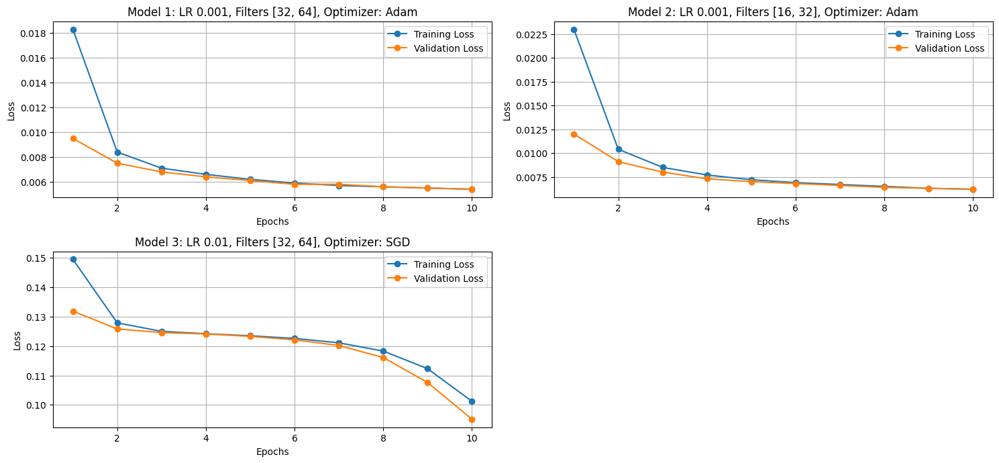

In [63]:
import matplotlib.pyplot as plt

# Data for the models
epochs = list(range(1, 11))

# Model 1: LR: 0.001, Kernel Size: 3, Filters: [32, 64], Optimizer: adam
train_loss_model1 = [0.0183, 0.0084, 0.0071, 0.0066, 0.0062, 0.0059, 0.0057, 0.0056, 0.0055, 0.0054]
val_loss_model1 = [0.0095, 0.0075, 0.0068, 0.0064, 0.0061, 0.0058, 0.0058, 0.0056, 0.0055, 0.0054]

# Model 2: LR: 0.001, Kernel Size: 3, Filters: [16, 32], Optimizer: adam
train_loss_model2 = [0.0230, 0.0104, 0.0085, 0.0077, 0.0072, 0.0069, 0.0067, 0.0065, 0.0063, 0.0062]
val_loss_model2 = [0.0120, 0.0091, 0.0080, 0.0073, 0.0070, 0.0068, 0.0066, 0.0064, 0.0063, 0.0062]

# Model 3: LR: 0.01, Kernel Size: 3, Filters: [32, 64], Optimizer: sgd
train_loss_model3 = [0.1495, 0.1279, 0.1250, 0.1242, 0.1235, 0.1226, 0.1211, 0.1183, 0.1123, 0.1012]
val_loss_model3 = [0.1319, 0.1258, 0.1246, 0.1241, 0.1233, 0.1221, 0.1202, 0.1161, 0.1076, 0.0951]

# Plotting the training and validation losses
plt.figure(figsize=(15, 10))

# Model 1
plt.subplot(3, 2, 1)
plt.plot(epochs, train_loss_model1, label='Training Loss', marker='o')
plt.plot(epochs, val_loss_model1, label='Validation Loss', marker='o')
plt.title('Model 1: LR 0.001, Filters [32, 64], Optimizer: Adam')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# Model 2
plt.subplot(3, 2, 2)
plt.plot(epochs, train_loss_model2, label='Training Loss', marker='o')
plt.plot(epochs, val_loss_model2, label='Validation Loss', marker='o')
plt.title('Model 2: LR 0.001, Filters [16, 32], Optimizer: Adam')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# Model 3
plt.subplot(3, 2, 3)
plt.plot(epochs, train_loss_model3, label='Training Loss', marker='o')
plt.plot(epochs, val_loss_model3, label='Validation Loss', marker='o')
plt.title('Model 3: LR 0.01, Filters [32, 64], Optimizer: SGD')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# Show the plots
plt.tight_layout()
plt.show()


**Best Performing Model**

- Final Training loss - 0.0051
- Final Validation loss - 0.0052
- Kernel size - 7
- Filters - [32,64]
- Optimizer - Adam
- Latent dimension - 64
- Learning Rate - 0.001

In [90]:
class Encoder_Config(nn.Module):
    def __init__(self, latent_dim, filters=[16, 32, 64], kernel_size=3):
        super(Encoder_Config, self).__init__()

        padding = kernel_size // 2
        
        self.conv1_encoder = nn.Conv2d(in_channels=1, out_channels=filters[0], kernel_size=kernel_size, stride=2, padding=padding)
        self.conv2_encoder = nn.Conv2d(in_channels=filters[0], out_channels=filters[1], kernel_size=kernel_size, stride=2, padding=padding)
        self.conv3_encoder=nn.Conv2d(in_channels=filters[1], out_channels=filters[2], kernel_size=kernel_size, stride=2, padding=padding)
        self.feature_size = self._get_convimg_size(28, kernel_size, padding)
        self.linear_encoder = nn.Linear(in_features=filters[2] * self.feature_size * self.feature_size, out_features=latent_dim
        )
        
    def _get_convimg_size(self, input_size, kernel_size, padding):
        img_size = input_size
        for _ in range(3): 
            img_size = (img_size + 2 * padding - kernel_size) // 2 + 1
        return img_size
    
    def forward(self, x):
        x = F.relu(self.conv1_encoder(x))
        x = F.relu(self.conv2_encoder(x))
        x=F.relu(self.conv3_encoder(x))
        x = x.view(x.size(0), -1)
        x = self.linear_encoder(x)
        return x,self.feature_size

class Decoder_Config(nn.Module):
    def __init__(self, latent_dim, feature_size, filters=[16, 32, 64], kernel_size=3):
        super(Decoder_Config, self).__init__()

        padding = (kernel_size-1)//2

        self.feature_size = feature_size
        
        self.filters = filters
        self.linear_decoder = nn.Linear(
            in_features=latent_dim,
            out_features=filters[2] * self.feature_size * self.feature_size
        )

        self.conv3_decoder=nn.ConvTranspose2d(
            in_channels=filters[2],
            out_channels=filters[1],
            kernel_size=kernel_size,
            stride=2,
            padding=padding,
            output_padding=1
        )
        
        self.conv2_decoder = nn.ConvTranspose2d(
            in_channels=filters[1],
            out_channels=filters[0],
            kernel_size=kernel_size,
            stride=2,
            padding=padding,
            output_padding=1
        )
        
        self.conv1_decoder = nn.ConvTranspose2d(
            in_channels=filters[0],
            out_channels=1,
            kernel_size=kernel_size,
            stride=2,
            padding=padding,
            output_padding=1
        )
    
    def forward(self, x):
        x = self.linear_decoder(x)
        x = x.view(x.size(0), self.filters[2], self.feature_size, self.feature_size)
        x=F.relu(self.conv3_decoder(x))
        x = F.relu(self.conv2_decoder(x))
        x = torch.sigmoid(self.conv1_decoder(x))
        return x


class CNNAutoEncoder_Config(nn.Module):
    def __init__(self,latent_dim,filters=[16,32,64],kernel_size=3):
        super(CNNAutoEncoder_Config,self).__init__()

        self.encoder= Encoder_Config(latent_dim,filters,kernel_size)
        self.decoder=Decoder_Config(latent_dim, self.encoder.feature_size, filters,kernel_size)
    
    def forward(self,x):
        latent_vec, feature_size=self.encoder(x)
        reconstructed_vec=self.decoder(latent_vec)
        return reconstructed_vec


In [ ]:
latent_dim = 64
model = CNNAutoEncoder_Config(latent_dim=latent_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for batch in train_loader:
        inputs = batch[0]
        
        optimizer.zero_grad()
        outputs = model(inputs)
        print(inputs.shape)
        print(outputs.shape)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    avg_train_loss = train_loss / len(train_loader)
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_train_loss:.4f}')

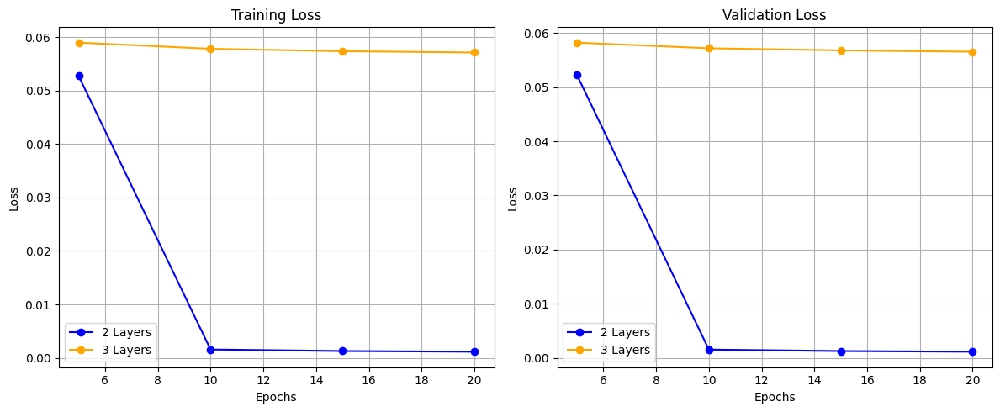

In [93]:
latent_dim = 64
model = CNNAutoEncoder_Config(latent_dim=latent_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for batch in train_loader:
        inputs = batch[0]
        
        optimizer.zero_grad()
        outputs = model(inputs)
        print(inputs.shape)
        print(outputs.shape)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    avg_train_loss = train_loss / len(train_loader)
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_train_loss:.4f}')

    epochs_2_layers = [5, 10, 15, 20]
train_loss_2_layers = [0.052760, 0.001550, 0.001266, 0.001131]
val_loss_2_layers = [0.052242, 0.001512, 0.001244, 0.001115]

# Data for 3 Layers
epochs_3_layers = [5, 10, 15, 20]
train_loss_3_layers = [0.059011, 0.057857, 0.057403, 0.057162]
val_loss_3_layers = [0.058241, 0.057197, 0.056811, 0.056557]

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot for Training Loss
axs[0].plot(epochs_2_layers, train_loss_2_layers, marker='o', label='2 Layers', color='blue')
axs[0].plot(epochs_3_layers, train_loss_3_layers, marker='o', label='3 Layers', color='orange')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].legend()
axs[0].grid()

# Plot for Validation Loss
axs[1].plot(epochs_2_layers, val_loss_2_layers, marker='o', label='2 Layers', color='blue')
axs[1].plot(epochs_3_layers, val_loss_3_layers, marker='o', label='3 Layers', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].legend()
axs[1].grid()

# Show the plots
plt.tight_layout()
plt.show()

Training with 2 Layers

- Epoch [5/20], Train Loss: 0.052760, Val Loss: 0.052242
- Epoch [10/20], Train Loss: 0.001550, Val Loss: 0.001512
- Epoch [15/20], Train Loss: 0.001266, Val Loss: 0.001244
- Epoch [20/20], Train Loss: 0.001131, Val Loss: 0.001115

Training with 3 Layers

- Epoch [5/20], Train Loss: 0.059011, Val Loss: 0.058241
- Epoch [10/20], Train Loss: 0.057857, Val Loss: 0.057197
- Epoch [15/20], Train Loss: 0.057403, Val Loss: 0.056811
- Epoch [20/20], Train Loss: 0.057162, Val Loss: 0.056557

More number of layers will generally require more number of epochs given same learning rate so as seen 1 layer has lower train and val loss as compared to 2 layers.

### 4.3 MLP Autoencoder

In [4]:
import numpy as np

class MLP_Regression:
    
    def __init__(self, lr=0.01, act_fun='relu', optimizer='sgd', num_hidden=2, num_neurons=[3,3],batch_size=32, num_epochs=100,seed=1989,logistic=False,loss='mse'):

        self.lr=lr
        self.optimizer=optimizer
        self.num_hidden=num_hidden
        self.num_neurons=num_neurons
        self.batch_size=batch_size
        self.num_epochs=num_epochs
        self.seed=seed
        self.act_fun=act_fun
        self.logistic=logistic
        self.loss=loss

        if loss=='mse':
            self.loss_func=self.mse_loss
        elif loss=='bce':
            self.loss_func=self.bce_loss

        if act_fun=='relu':
            self.activation_func=self.relu
            self.activation_derivative=self.relu_derivative
        elif act_fun=='sigmoid':
            self.activation_func=self.sigmoid
            self.activation_derivative=self.sigmoid_derivative
        elif act_fun=='tanh':
            self.activation_func=self.tanh
            self.activation_derivative=self.tanh_derivative
        elif act_fun=='linear':
            self.activation_func=self.linear
            self.activation_derivative=self.linear

        self.X_train=None    
        self.Y_train=None
        self.X_val=None
        self.Y_val=None
        self.layer_act=None
        self.layer_z=None
        self.weights=None
        self.biases=None
        self.layer_sizes =None

    def set_lr(self, lr):
        self.lr=lr 
    
    def set_activation_func(self, act_fun):
        self.activation_func=act_fun
    
    def set_optimizer(self, optimizer):
        self.optimizer=optimizer
    
    def set_num_hidden(self, num_hidden):
        self.num_hidden=num_hidden
    
    def set_num_neurons(self, num_neurons):
        self.num_neurons=num_neurons
    
    def set_batch_size(self, batch_size):
        self.batch_size=batch_size
    
    def set_num_epochs(self, num_epochs):
        self.num_epochs=num_epochs
    
    def model_parameters(self):
        return {
            'learning_rate': self.lr,
            'activation_function': self.act_fun,
            'optimizer': self.optimizer,
            'num_hidden_layers': self.num_hidden,
            'neurons_per_layer': self.num_neurons,
            'batch_size': self.batch_size,
            'num_epochs': self.num_epochs
        }
    
    def relu(self, X):
        return np.maximum(0,X)
    
    def relu_derivative(self, X):
        return np.where(X>0,1,0)

    def sigmoid(self, X):
        return 1./(1.+np.exp(-X))
    
    def sigmoid_derivative(self, X):
        return self.sigmoid(X)*(1-self.sigmoid(X))
    
    def tanh(self, X):
        return np.tanh(X)
    
    def tanh_derivative(self, X):
        return 1-self.tanh(X)**2
    
    def linear(self, X):
        return X
    
    def init_layers(self,batch_size):
        self.layer_z=[np.empty((batch_size,layer)) for layer in self.layer_sizes]
        self.layer_act=[np.empty((batch_size,layer)) for layer in self.layer_sizes]
    
    def initialize_params(self):
        np.random.seed(self.seed)
        weights = []
        biases = []
        for i in range(self.layer_sizes.shape[0] - 1):
            input_size = self.layer_sizes[i]
            output_size = self.layer_sizes[i+1]
            lim=np.sqrt(2/input_size)
            weight_matrix = np.random.randn(input_size, output_size)*lim
            weights.append(weight_matrix)
            bias_vector = np.random.randn(1, output_size)
            biases.append(bias_vector)
        
        self.weights=weights
        self.biases=biases

    def bce_loss(self,Y_pred,Y_true):
        return -np.mean(Y_true*np.log(Y_pred)+(1-Y_true)*np.log(1-Y_pred))

    def mse_loss(self,Y_pred,Y_true):
        return np.mean((Y_pred-Y_true)**2)

    def rmse_loss(self,Y_pred, Y_true):
        return np.sqrt(np.mean((Y_true - Y_pred)**2))
    
    def rsquared(self,Y_pred,Y_true):
        return 1 - (np.sum((Y_true - Y_pred)**2) / np.sum((Y_true - np.mean(Y_true))**2))
    
    def forward_pass(self, X):
        # here X is a batch of samples - (N_samples * d_features)
        
        self.layer_act[0]=X
        self.layer_z[0]=X
        for i in range(len(self.weights)-1):
            X=np.dot(X,self.weights[i])+self.biases[i]
            self.layer_z[i+1]=X
            X=self.activation_func(X)
            self.layer_act[i+1]=X
        
        X=np.dot(X,self.weights[-1])+self.biases[-1]
        self.layer_z[-1]=X
        if self.logistic==True:
            X=self.sigmoid(X)
            self.layer_act[-1]=X
        else:
            self.layer_act[-1]=X

        return self.layer_act[-1]
    
    def backward_pass(self,Y,batch_size):

        grad_w=[np.zeros_like(weight) for weight in self.weights]
        grad_b=[np.zeros_like(bias) for bias in self.biases]
        # here Y is the corresponding true labels of the batch of X samples provided in the forward pass

        if self.logistic==True:
            if self.loss=='bce':
                error=((self.layer_act[-1]-Y)/(self.layer_act[-1]*(1-self.layer_act[-1])))*self.sigmoid_derivative(self.layer_z[-1])
            elif self.loss=='mse':
                error=(self.layer_act[-1]-Y)*self.sigmoid_derivative(self.layer_z[-1])
        else:
            error=(self.layer_act[-1]-Y)
        # derivaive of loss function with respect to the output layer using chain rule.
        
        grad_w[-1]=np.dot(self.layer_act[-2].T,error)/batch_size
        grad_b[-1]=np.sum(error,axis=0,keepdims=True)/batch_size

        for i in range(len(self.weights)-2,0,-1):
            error=np.dot(error,self.weights[i+1].T) * self.activation_derivative(self.layer_z[i+1])
            grad_w[i]=np.dot(self.layer_act[i].T,error)/batch_size
            grad_b[i]=np.sum(error,axis=0,keepdims=True)/batch_size
        
        if self.logistic==False:
            error=np.dot(error,self.weights[1].T)*self.activation_derivative(self.layer_z[1])
            grad_w[0]=np.dot(self.layer_act[0].T,error)/batch_size
            grad_b[0]=np.sum(error,axis=0,keepdims=True)/batch_size

        return grad_w,grad_b
    
    def update_params(self,grad_w,grad_b):

        for i in range(len(self.weights)):
            self.weights[i]-=self.lr*grad_w[i]
            self.biases[i]-=self.lr*grad_b[i]
    
    def fit(self, X_train, Y_train, X_val, Y_val):
        self.X_train=X_train
        self.Y_train=Y_train
        self.X_val=X_val
        self.Y_val=Y_val

        self.layer_sizes = np.array([X_train.shape[1]] + self.num_neurons + [Y_train.shape[1]])
        self.initialize_params()

    
    def fit_train(self, X_train, Y_train, X_val, Y_val):
        self.X_train=X_train
        self.Y_train=Y_train
        self.X_val=X_val
        self.Y_val=Y_val

        self.layer_sizes = np.array([X_train.shape[1]] + self.num_neurons + [Y_train.shape[1]])
        self.initialize_params()

        if self.optimizer=='sgd':
            batch_size=1
        elif self.optimizer=='gd':
            batch_size=len(X_train)
        elif self.optimizer=='mini-batch':
            batch_size=32
        
        n_samples = X_train.shape[0]
        best_loss = float('inf')
        patience_counter=0
        best_weights=None

        # training loop
        for epoch in range(self.num_epochs):
            indices = np.random.permutation(n_samples)
            X_train_shuffled = X_train[indices]
            Y_train_shuffled = Y_train[indices]

            for i in range(0, n_samples, batch_size):
                batch_end=min(i+batch_size,n_samples)
                X_batch = X_train_shuffled[i:batch_end]
                Y_batch = Y_train_shuffled[i:batch_end]

                self.init_layers(X_batch.shape[0])
                y_pred=self.forward_pass(X_batch)
                grad_w,grad_b = self.backward_pass(Y_batch,batch_size)
                self.update_params(grad_w,grad_b)

            self.init_layers(X_val.shape[0])
            y_val_pred=self.forward_pass(X_val)
            val_loss = self.mse_loss(y_val_pred,Y_val)

            self.init_layers(X_train.shape[0])
            y_train_pred=self.forward_pass(X_train)
            train_loss = self.mse_loss(y_train_pred,Y_train)

            print(f'Epoch {epoch+1}/{self.num_epochs}: Training Loss: {train_loss}, Validation Loss: {val_loss}')

            if val_loss < best_loss:
                best_loss = val_loss
                best_weights = self.weights,self.biases
                patience_counter=0
            else:
                patience_counter+=1

            if patience_counter>=5:
                if best_weights is not None:
                    self.weights,self.biases=best_weights
                break
    
    def predict(self,X_test):
        self.init_layers(X_test.shape[0])
        if self.logistic==True:
            pred=self.forward_pass(X_test)
            return np.where(pred>0.5,1,0)
        else:
            return self.forward_pass(X_test)
    
    def numerical_gradient(self,X,Y,e=1e-6):
        num_grad_w=[]
        num_grad_b=[]

        for i in range(len(self.weights)):
            grad_w=np.zeros_like(self.weights[i])
            grad_b=np.zeros_like(self.biases[i])

            for j in range(self.weights[i].shape[0]):
                for k in range(self.weights[i].shape[1]):

                    self.init_layers(X.shape[0])
                    self.weights[i][j,k]+=e
                    y_pred=self.forward_pass(X)
                    loss1=self.mse_loss(y_pred,Y)

                    self.init_layers(X.shape[0])
                    self.weights[i][j,k]-=2*e
                    y_pred=self.forward_pass(X)
                    loss2=self.mse_loss(y_pred,Y)

                    self.weights[i][j,k]+=e

                    grad_w[j,k]=(loss1-loss2)/(2*e)
            
            for j in range(self.biases[i].shape[1]):

                self.biases[i][0,j]+=e
                self.init_layers(X.shape[0])
                y_pred=self.forward_pass(X)
                loss1=self.mse_loss(y_pred,Y)

                self.biases[i][0,j]-=2*e
                self.init_layers(X.shape[0])
                y_pred=self.forward_pass(X)
                loss2=self.mse_loss(y_pred,Y)

                self.biases[i][0,j]+=e

                grad_b[0,j]=(loss1-loss2)/(2*e)
            
            num_grad_w.append(grad_w)
            num_grad_b.append(grad_b)
        
        return num_grad_w,num_grad_b
    
    def check_gradients(self,X,Y,threshold=1e-5):
        self.init_layers(X.shape[0])
        y_pred=self.forward_pass(X)
        grad_w,grad_b=self.backward_pass(Y,X.shape[0])

        num_grad_w,num_grad_b=self.numerical_gradient(X,Y)

        for i in range(len(grad_w)):
            difference_w = np.linalg.norm(grad_w[i] - num_grad_w[i])
            difference_b = np.linalg.norm(grad_b[i] - num_grad_b[i])
            
            print(f'Layer {i + 1}:')
            print(f'  Weight Gradient Difference: {difference_w}')
            print(f'  Bias Gradient Difference: {difference_b}')
            
            if difference_w > threshold or difference_b > threshold:
                print('Gradient check failed!')
            else:
                print('Gradient check passed!')

In [6]:
class AutoEncoder:

    def __init__(self, latent_dim,batch_size=256,num_hidden=5,num_neurons=[16,8,8,16],lr=0.01, act_fun='tanh', optimizer='gd',num_epochs=100):

        if num_hidden%2==0:
            self.index=(num_hidden+2)//2
            cut=len(num_neurons)//2+1
            encoder_neurons=num_neurons[:cut]
            decoder_neurons = num_neurons[cut:]
        else:
            self.index=(num_hidden+2)//2
            cut=len(num_neurons)//2
            encoder_neurons=num_neurons[:cut]
            decoder_neurons = num_neurons[cut:]
        
        hidden_neurons = encoder_neurons + [latent_dim] + decoder_neurons
        # input -> encoder -> latent -> decoder -> output
        self.autoencoder=MLP_Regression(lr=lr, batch_size=batch_size,act_fun=act_fun, optimizer=optimizer,num_hidden=num_hidden, num_neurons=hidden_neurons, num_epochs=num_epochs)

    def fit(self, X_train,X_val):
        Y_train = X_train
        Y_val = X_val
        self.autoencoder.fit(X_train,Y_train,X_val,Y_val)

        if self.autoencoder.optimizer=='gd':
            batch_size=X_train.shape[0]
        elif self.autoencoder.optimizer=='mini-batch':
            batch_size=self.autoencoder.batch_size
        else:
            batch_size=1
        
        n_samples = X_train.shape[0]
        best_loss=float('inf')
        patience_counter=0
        best_weights=None
        train_losses=[]
        val_losses=[]
        
        for epoch in range(self.autoencoder.num_epochs):
            indices = np.random.permutation(X_train.shape[0])
            X_train_shuffled = X_train[indices]
            Y_train_shuffled = Y_train[indices]
            
            for i in range(0, n_samples, batch_size):
                batch_end=min(i+batch_size,n_samples)
                X_batch = X_train_shuffled[i:batch_end]
                Y_batch = Y_train_shuffled[i:batch_end]

                self.autoencoder.init_layers(X_batch.shape[0])
                y_pred=self.autoencoder.forward_pass(X_batch)
                grad_w,grad_b = self.autoencoder.backward_pass(Y_batch,batch_size)
                self.autoencoder.update_params(grad_w,grad_b)
                val_loss = self.autoencoder.mse_loss(y_pred,Y_batch)
                # print("Epoch: ",epoch," Batch: ",i," Loss: ",val_loss)
            
            self.autoencoder.init_layers(X_val.shape[0])
            y_val_pred=self.autoencoder.forward_pass(X_val)
            val_loss = self.autoencoder.mse_loss(y_val_pred,Y_val)
            val_losses.append(val_loss)

            self.autoencoder.init_layers(X_train.shape[0])
            y_train_pred=self.autoencoder.forward_pass(X_train)
            train_loss = self.autoencoder.mse_loss(y_train_pred,Y_train)
            train_losses.append(train_loss)

            print("Epoch: ",epoch," Train Loss: ",train_loss," Val Loss: ",val_loss)

            if val_loss < best_loss:
                best_loss = val_loss
                best_weights=self.autoencoder.weights, self.autoencoder.biases
                patience_counter=0
            else:
                patience_counter+=1
            
            if patience_counter>=5:
                if best_weights is not None:
                    self.autoencoder.weights,self.autoencoder.biases=best_weights
                    print("Early Stopping")
                break
        return train_losses, val_losses

    def get_latent(self, X):
        self.autoencoder.init_layers(X.shape[0])
        reconsructed = self.autoencoder.forward_pass(X)
        return self.autoencoder.layer_act[self.index]
    
    def get_reconstructed(self,X):
        self.autoencoder.init_layers(X.shape[0])
        reconstructed=self.autoencoder.forward_pass(X)
        return reconstructed

In [52]:
X_train = train_df.iloc[:, 1:].values  
y_train = train_df.iloc[:, 0].values 
X_train = X_train.astype('float32') / 255.0
print(X_train.shape)

X_val = val_df.iloc[:, 1:].values
y_val = val_df.iloc[:, 0].values
X_val = X_val.astype('float32') / 255.0

X_test = test_df.iloc[:, 1:].values
y_test = test_df.iloc[:, 0].values
X_test=X_test.astype('float32') / 255.0

print(X_train.shape)
print(y_val.shape)

(49000, 784)
(49000, 784)
(7000,)


In [62]:
latent_dim=64
mlp_autoenc=AutoEncoder(latent_dim,batch_size=64,num_hidden=5,num_neurons=[256,128,128,256],lr=0.001, act_fun='tanh', optimizer='mini-batch',num_epochs=10)
train_losses,val_losses=mlp_autoenc.fit(X_train,X_val)

Epoch:  0  Train Loss:  0.06101913927551483  Val Loss:  0.060958907470926776
Epoch:  1  Train Loss:  0.04667972438524979  Val Loss:  0.0466030014332052
Epoch:  2  Train Loss:  0.04333819590602327  Val Loss:  0.04326450306227191
Epoch:  3  Train Loss:  0.040521505612743904  Val Loss:  0.04044978408190954
Epoch:  4  Train Loss:  0.03778742438206037  Val Loss:  0.03771874944074125
Epoch:  5  Train Loss:  0.03550197916141687  Val Loss:  0.03544919455788449
Epoch:  6  Train Loss:  0.03370027587984256  Val Loss:  0.03364112555179164
Epoch:  7  Train Loss:  0.032236853002099254  Val Loss:  0.03218785872964309
Epoch:  8  Train Loss:  0.030971781907141404  Val Loss:  0.03091001984706377
Epoch:  9  Train Loss:  0.030009832393651428  Val Loss:  0.029940841643886423


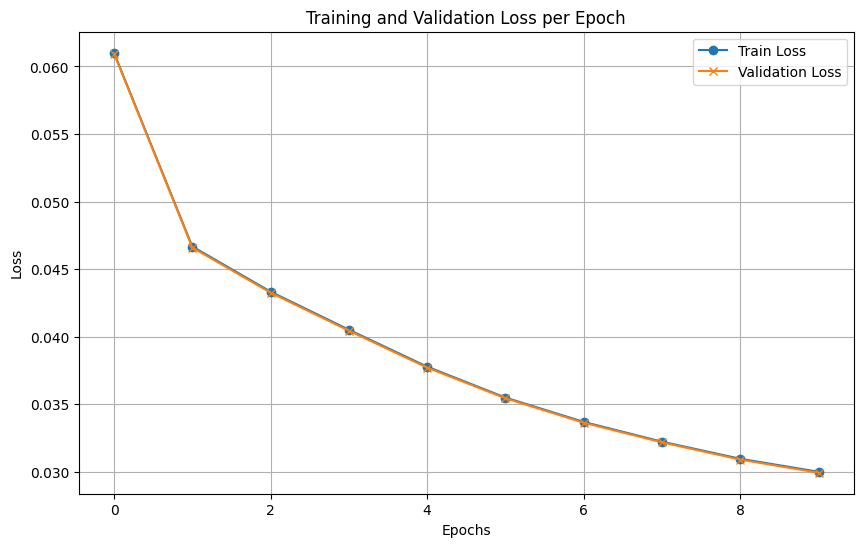

In [64]:
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Validation Loss', marker='x')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

In [59]:
test_images = torch.tensor(test_df.iloc[:, 1:].values, dtype=torch.float32).view(-1, 1, 28, 28) / 255.0
test_images_np = test_df.iloc[:, 1:].values.astype(np.float32).reshape(-1, 1, 28, 28) / 255.0
test_images_np=test_images_np[:10,:,:,:]
test_images=test_images[:10,:,:,:]
print(test_images_np.shape)

(10, 1, 28, 28)


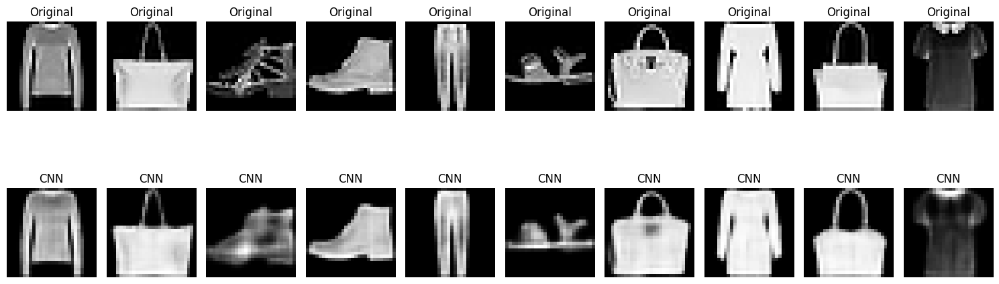

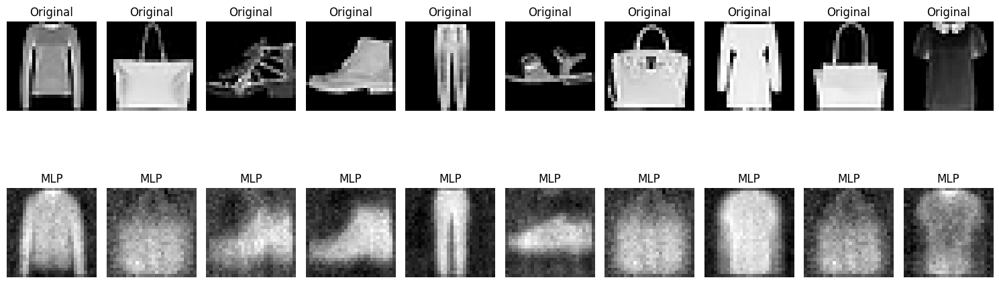

In [65]:
model.eval()

input_imgs=test_images
input_imgs = input_imgs.to(next(model.parameters()).device)

with torch.inference_mode():
    reconstructed_imgs=model(input_imgs)
    
plt.figure(figsize=(15, 6))
for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(input_imgs[i].cpu().squeeze(), cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, num_images, i + 1 + num_images)
    plt.imshow(reconstructed_imgs[i].cpu().squeeze(), cmap='gray')
    plt.title('CNN')
    plt.axis('off')
plt.tight_layout()
plt.show()

input_imgs=test_images_np
input_imgs=input_imgs.reshape(10,784)
recon_img=mlp_autoenc.get_reconstructed(input_imgs)
input_imgs=input_imgs.reshape(10,1,28,28)
recon_img=recon_img.reshape(10,1,28,28)

plt.figure(figsize=(15, 6))
for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(input_imgs[i].squeeze(), cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, num_images, i + 1 + num_images)
    plt.imshow(recon_img[i].squeeze(), cmap='gray')
    plt.title('MLP')
    plt.axis('off')

plt.tight_layout()
plt.show()





**Comparison**

*Final Val losses:*

- CNN - 0.0054
- MLP - 0.0299

*Image Quality and Clarity:*

CNN Autoencoder:

- Produces clearer, more defined reconstructions
- Maintains better shape definition and edges
- Preserves more detailed features of the clothing items and accessories
- Shows less blurring and distortion


MLP Autoencoder:

- Generates notably more noisy and grainy reconstructions
- Shows significant loss of detail and structure
- Exhibits a "static-like" pattern across images
- Has more blurred and diffused edges

*Specific Item Comparisons:*

1. T-shirts/Clothing:

CNN: Maintains clear outline and basic details of the garment
MLP: Basic shape is visible but with significant noise and loss of detail

2. Bags/Accessories:

CNN: Handle and bag structure are well-preserved
MLP: Only rough shapes are discernible, with handles barely visible

3. Footwear:

CNN: Shoe contours and basic design elements are visible
MLP: Basic shoe shape is present but details are lost in noise


*Overall Assessment:*

The CNN autoencoder significantly outperforms the MLP autoencoder in terms of:

- Detail preservation
- Image clarity
- Structure retention
- Noise reduction
- Edge definition

This superior performance can be attributed to:

1. CNN's ability to capture spatial relationships in the data
2. The hierarchical feature learning capability of convolutional layers
3. Better preservation of local patterns and structures
4. More efficient parameter usage for image-based tasks

The MLP autoencoder's inferior performance is likely due to:

1. Flattening of spatial information
2. Loss of local relationship information
3. More difficulty in learning relevant features from flattened input
4. Less efficient architecture for image processing tasks

### 4.4 PCA AutoEncoder

In [100]:
class PCA_AutoEncoder:

    def __init__(self, components):
        self.n_components = components
        self.components=None
        self.train_data = None
        self.mean = None
        self.std=None
        self.explained_variance=None
    
    def fit(self,X):
        self.train_data=X

        # we calculate the mean of the data along each feature
        self.mean=np.mean(self.train_data,axis=0)

        # we subtract the mean from the data and divide by the standard deviation
        X_centered=(self.train_data-self.mean)

        # we calculate the covariance matrix of the data
        # LLM ***
        cov_matrix = np.cov(X_centered.T)

        # we calculate the eigen values and eigen vectors of the covariance matrix using eigh instead of eig since the covariance matrix is symmetric and eig was giving us complex values
        eigen_values, eigen_vectors = np.linalg.eigh(cov_matrix)

        sorted_index = np.argsort(eigen_values)[::-1]
        eigen_values = eigen_values[sorted_index]
        eigen_vectors = eigen_vectors[:, sorted_index]
        eigval_sum=np.sum(eigen_values)

        self.components = eigen_vectors[:, :self.n_components]
        self.explained_variance = eigen_values[:self.n_components]/eigval_sum

    def encode(self, to_transform):

        to_transform_centered = to_transform - self.mean
        transformed_data=np.dot(to_transform_centered, self.components)
        return transformed_data
    
    def forward(self,X):
        transformed = self.encode(X)
        X_mean = np.mean(X, axis=0)
        # convert mean to 2D array
        X_mean_arr = np.array([X_mean])
        # Reconstruct the data by projecting back to the original space
        X_reconstructed = np.dot(transformed, self.components.T) + X_mean_arr
        return X_reconstructed

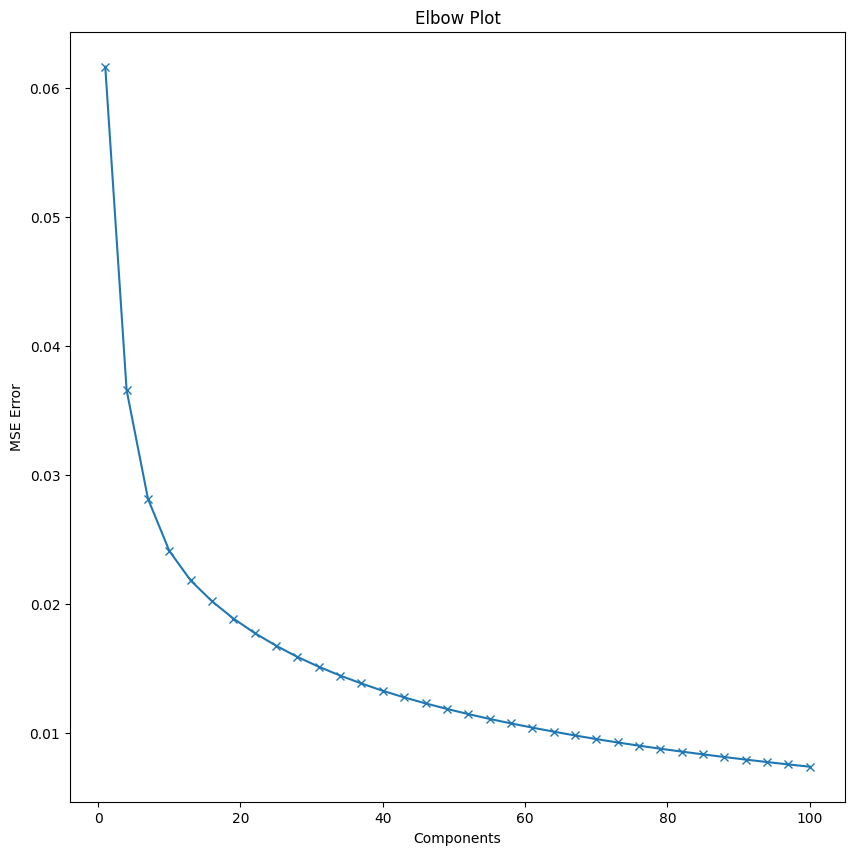

In [104]:
range_n = range(1, 101, 3)  
errors = []

for components in range_n:

    model = PCA_AutoEncoder(components)
    model.fit(X_val)  # Using validation data to evaluate reconstruction error
    
    # Reconstruct the validation data
    reconstructed = model.forward(X_val)
    
    error = np.mean(np.square(X_val - reconstructed))
    errors.append(error)

plt.figure(figsize=(10, 10))
plt.plot(range_n, errors, marker='x')
plt.xlabel("Components")
plt.ylabel("MSE Error")
plt.title("Elbow Plot")
plt.show()


Optimal number of components according to the elbow o,ot is around 25. 

K_optimal = 25

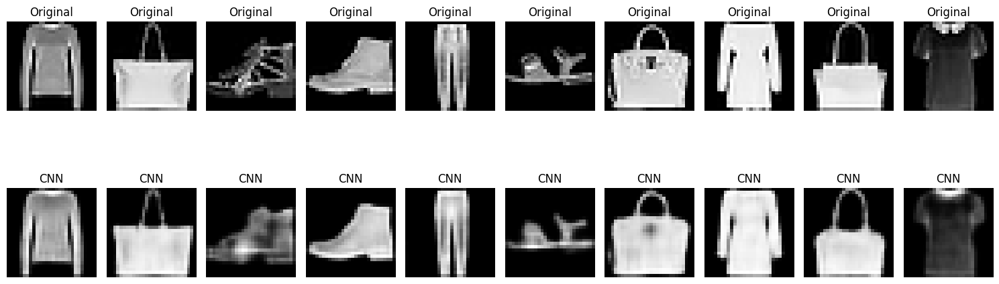

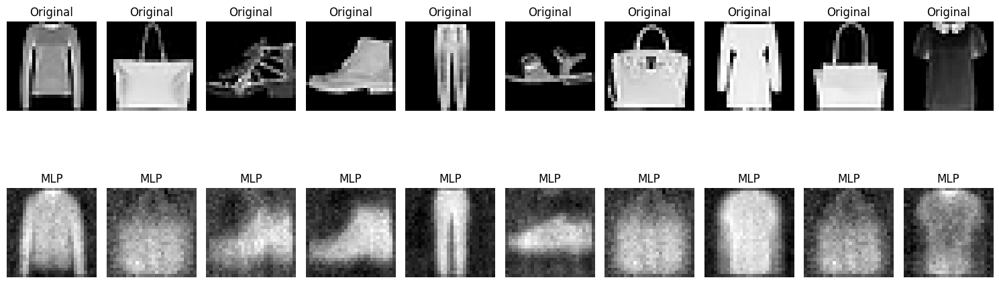

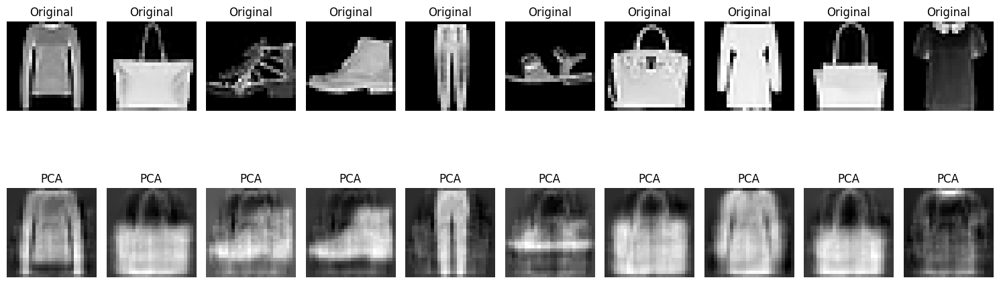

In [109]:
model.eval()

input_imgs=test_images
input_imgs = input_imgs.to(next(model.parameters()).device)

with torch.inference_mode():
    reconstructed_imgs=model(input_imgs)
    
plt.figure(figsize=(15, 6))
for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(input_imgs[i].cpu().squeeze(), cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, num_images, i + 1 + num_images)
    plt.imshow(reconstructed_imgs[i].cpu().squeeze(), cmap='gray')
    plt.title('CNN')
    plt.axis('off')
plt.tight_layout()
plt.show()

input_imgs=test_images_np
input_imgs=input_imgs.reshape(10,784)
recon_img=mlp_autoenc.get_reconstructed(input_imgs)
input_imgs=input_imgs.reshape(10,1,28,28)
recon_img=recon_img.reshape(10,1,28,28)

plt.figure(figsize=(15, 6))
for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(input_imgs[i].squeeze(), cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, num_images, i + 1 + num_images)
    plt.imshow(recon_img[i].squeeze(), cmap='gray')
    plt.title('MLP')
    plt.axis('off')

plt.tight_layout()
plt.show()

pca_autoencoder=PCA_AutoEncoder(25)
pca_autoencoder.fit(X_train)
input_imgs=test_images_np
input_imgs=input_imgs.reshape(10,784)
reconstructed = pca_autoencoder.forward(input_imgs)
input_imgs=input_imgs.reshape(10,1,28,28)
reconstructed=reconstructed.reshape(10,1,28,28)

plt.figure(figsize=(15, 6))
for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(input_imgs[i].squeeze(), cmap='gray')
    plt.title('Original')
    plt.axis('off')

    plt.subplot(2, num_images, i + 1 + num_images)
    plt.imshow(reconstructed[i].squeeze(), cmap='gray')
    plt.title('PCA')
    plt.axis('off')

plt.tight_layout()
plt.show()

- The images become a bit blur but we can capture most of the information from the images and they are easily identifiable.
- Compared to MLP, PCA captures most of the variance.
- CNN is still much better compared to these two due to its capability of complex architecture. 
